In [1]:
import sys
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet")
import dense_unet

# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}
FILE_NAME = 'dense_unet_30ep_512_aG_wo_decay'
INPUT_SHAPE = (512, 512, 1)
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/" + FILE_NAME + ".tf"
HISTORY_PATH = "/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/history/" + FILE_NAME + '_history' ".json"

TRAIN_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Train'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'

2024-01-30 17:15:41.239311: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-30 17:15:41.239339: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-30 17:15:41.240465: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-30 17:15:41.245913: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-30 17:15:41.825654: W tensorflow/compiler/tf2

In [6]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}


# Create augmentation
train_preproc = preprocess.build_augmentation_for_adaptive()
test_preproc = preprocess.build_augmentation_for_adaptive(is_train=False)

# Create train, test generator
train_generator = data_generator.AdaptiveDataGenerator(
    TRAIN_SOURCE,
    number_of_images=2,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=True,
    augmentation= train_preproc
)

test_generator = data_generator.AdaptiveDataGenerator(
    TRAIN_SOURCE,
    number_of_images=2,
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=True,
    augmentation= train_preproc
)

# Create model
model = dense_unet.build_model(input_shape=INPUT_SHAPE)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 conv2d_10 (Conv2D)          (None, 512, 512, 48)         480       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_8 (Bat  (None, 512, 512, 48)         192       ['conv2d_10[0][0]']           
 chNormalization)                                                                                 
                                                                                                  
 activation_8 (Activation)   (None, 512, 512, 48)         0         ['batch_normalization_8[

In [7]:
train.model_train(model,
                  epoch = 30,
                  train_generator = train_generator,
                  test_generator = test_generator,
                  model_path = MODEL_PATH,
                  history_path = HISTORY_PATH,
                  save_every_epoch=True,
                  apply_weight_decay=False)

Epoch 1/30


2024-01-30 17:17:17.868837: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904
2024-01-30 17:17:20.201547: I external/local_xla/xla/service/service.cc:168] XLA service 0x7fca0cd0df50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-01-30 17:17:20.201568: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3080 Ti, Compute Capability 8.6
2024-01-30 17:17:20.204956: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1706635040.272223  503190 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


440/440 [==============================] - ETA: 0s - loss: 0.4430 - sensitivity: 0.5766 - specificity: 0.9446 - accuracy: 0.9205INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/1--0.4430-0.5766-0.9446-0.0547-0.9988.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/1--0.4430-0.5766-0.9446-0.0547-0.9988.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/1--0.4430-0.5766-0.9446-0.0547-0.9988.pb
440/440 [==============================] - 208s 445ms/step - loss: 0.4430 - sensitivity: 0.5766 - specificity: 0.9446 - accuracy: 0.9205 - val_loss: 0.7163 - val_sensitivity: 0.0547 - val_specificity: 0.9988 - val_accuracy: 0.9347
Epoch 2/30
440/440 [==============================] - ETA: 0s - loss: 0.3342 - sensitivity: 0.6406 - specificity: 0.9743 - accuracy: 0.9524INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/2--0.3342-0.6406-0.9743-0.5938-0.9776.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/2--0.3342-0.6406-0.9743-0.5938-0.9776.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/2--0.3342-0.6406-0.9743-0.5938-0.9776.pb
440/440 [==============================] - 198s 451ms/step - loss: 0.3342 - sensitivity: 0.6406 - specificity: 0.9743 - accuracy: 0.9524 - val_loss: 0.3391 - val_sensitivity: 0.5938 - val_specificity: 0.9776 - val_accuracy: 0.9540
Epoch 3/30
440/440 [==============================] - ETA: 0s - loss: 0.3145 - sensitivity: 0.6544 - specificity: 0.9761 - accuracy: 0.9556INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/3--0.3145-0.6544-0.9761-0.6209-0.9760.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/3--0.3145-0.6544-0.9761-0.6209-0.9760.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/3--0.3145-0.6544-0.9761-0.6209-0.9760.pb
440/440 [==============================] - 203s 461ms/step - loss: 0.3145 - sensitivity: 0.6544 - specificity: 0.9761 - accuracy: 0.9556 - val_loss: 0.3395 - val_sensitivity: 0.6209 - val_specificity: 0.9760 - val_accuracy: 0.9547
Epoch 4/30
440/440 [==============================] - ETA: 0s - loss: 0.3058 - sensitivity: 0.6635 - specificity: 0.9765 - accuracy: 0.9566INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/4--0.3058-0.6635-0.9765-0.6435-0.9706.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/4--0.3058-0.6635-0.9765-0.6435-0.9706.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/4--0.3058-0.6635-0.9765-0.6435-0.9706.pb
440/440 [==============================] - 198s 450ms/step - loss: 0.3058 - sensitivity: 0.6635 - specificity: 0.9765 - accuracy: 0.9566 - val_loss: 0.3291 - val_sensitivity: 0.6435 - val_specificity: 0.9706 - val_accuracy: 0.9526
Epoch 5/30
440/440 [==============================] - ETA: 0s - loss: 0.2840 - sensitivity: 0.6884 - specificity: 0.9779 - accuracy: 0.9590INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/5--0.2840-0.6884-0.9779-0.5834-0.9836.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/5--0.2840-0.6884-0.9779-0.5834-0.9836.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/5--0.2840-0.6884-0.9779-0.5834-0.9836.pb
440/440 [==============================] - 201s 457ms/step - loss: 0.2840 - sensitivity: 0.6884 - specificity: 0.9779 - accuracy: 0.9590 - val_loss: 0.3220 - val_sensitivity: 0.5834 - val_specificity: 0.9836 - val_accuracy: 0.9597
Epoch 6/30
440/440 [==============================] - ETA: 0s - loss: 0.2880 - sensitivity: 0.6812 - specificity: 0.9793 - accuracy: 0.9604INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/6--0.2880-0.6812-0.9793-0.6252-0.9803.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/6--0.2880-0.6812-0.9793-0.6252-0.9803.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/6--0.2880-0.6812-0.9793-0.6252-0.9803.pb
440/440 [==============================] - 196s 445ms/step - loss: 0.2880 - sensitivity: 0.6812 - specificity: 0.9793 - accuracy: 0.9604 - val_loss: 0.3041 - val_sensitivity: 0.6252 - val_specificity: 0.9803 - val_accuracy: 0.9586
Epoch 7/30
440/440 [==============================] - ETA: 0s - loss: 0.2808 - sensitivity: 0.6825 - specificity: 0.9786 - accuracy: 0.9599INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/7--0.2808-0.6825-0.9786-0.5834-0.9846.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/7--0.2808-0.6825-0.9786-0.5834-0.9846.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/7--0.2808-0.6825-0.9786-0.5834-0.9846.pb
440/440 [==============================] - 182s 413ms/step - loss: 0.2808 - sensitivity: 0.6825 - specificity: 0.9786 - accuracy: 0.9599 - val_loss: 0.3068 - val_sensitivity: 0.5834 - val_specificity: 0.9846 - val_accuracy: 0.9600
Epoch 8/30
440/440 [==============================] - ETA: 0s - loss: 0.2779 - sensitivity: 0.6871 - specificity: 0.9793 - accuracy: 0.9608INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/8--0.2779-0.6871-0.9793-0.5638-0.9864.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/8--0.2779-0.6871-0.9793-0.5638-0.9864.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/8--0.2779-0.6871-0.9793-0.5638-0.9864.pb
440/440 [==============================] - 194s 442ms/step - loss: 0.2779 - sensitivity: 0.6871 - specificity: 0.9793 - accuracy: 0.9608 - val_loss: 0.3183 - val_sensitivity: 0.5638 - val_specificity: 0.9864 - val_accuracy: 0.9596
Epoch 9/30
440/440 [==============================] - ETA: 0s - loss: 0.2702 - sensitivity: 0.6898 - specificity: 0.9793 - accuracy: 0.9603INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/9--0.2702-0.6898-0.9793-0.6345-0.9819.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/9--0.2702-0.6898-0.9793-0.6345-0.9819.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/9--0.2702-0.6898-0.9793-0.6345-0.9819.pb
440/440 [==============================] - 200s 455ms/step - loss: 0.2702 - sensitivity: 0.6898 - specificity: 0.9793 - accuracy: 0.9603 - val_loss: 0.2871 - val_sensitivity: 0.6345 - val_specificity: 0.9819 - val_accuracy: 0.9606
Epoch 10/30
440/440 [==============================] - ETA: 0s - loss: 0.2712 - sensitivity: 0.6913 - specificity: 0.9801 - accuracy: 0.9625INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/10--0.2712-0.6913-0.9801-0.6698-0.9805.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/10--0.2712-0.6913-0.9801-0.6698-0.9805.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/10--0.2712-0.6913-0.9801-0.6698-0.9805.pb
440/440 [==============================] - 199s 451ms/step - loss: 0.2712 - sensitivity: 0.6913 - specificity: 0.9801 - accuracy: 0.9625 - val_loss: 0.2789 - val_sensitivity: 0.6698 - val_specificity: 0.9805 - val_accuracy: 0.9625
Epoch 11/30
440/440 [==============================] - ETA: 0s - loss: 0.2681 - sensitivity: 0.6949 - specificity: 0.9806 - accuracy: 0.9624INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/11--0.2681-0.6949-0.9806-0.6775-0.9767.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/11--0.2681-0.6949-0.9806-0.6775-0.9767.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/11--0.2681-0.6949-0.9806-0.6775-0.9767.pb
440/440 [==============================] - 198s 450ms/step - loss: 0.2681 - sensitivity: 0.6949 - specificity: 0.9806 - accuracy: 0.9624 - val_loss: 0.2861 - val_sensitivity: 0.6775 - val_specificity: 0.9767 - val_accuracy: 0.9594
Epoch 12/30
440/440 [==============================] - ETA: 0s - loss: 0.2609 - sensitivity: 0.7019 - specificity: 0.9812 - accuracy: 0.9636INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/12--0.2609-0.7019-0.9812-0.6415-0.9805.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/12--0.2609-0.7019-0.9812-0.6415-0.9805.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/12--0.2609-0.7019-0.9812-0.6415-0.9805.pb
440/440 [==============================] - 196s 446ms/step - loss: 0.2609 - sensitivity: 0.7019 - specificity: 0.9812 - accuracy: 0.9636 - val_loss: 0.2900 - val_sensitivity: 0.6415 - val_specificity: 0.9805 - val_accuracy: 0.9609
Epoch 13/30
440/440 [==============================] - ETA: 0s - loss: 0.2540 - sensitivity: 0.7118 - specificity: 0.9812 - accuracy: 0.9641INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/13--0.2540-0.7118-0.9812-0.5984-0.9869.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/13--0.2540-0.7118-0.9812-0.5984-0.9869.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/13--0.2540-0.7118-0.9812-0.5984-0.9869.pb
440/440 [==============================] - 195s 443ms/step - loss: 0.2540 - sensitivity: 0.7118 - specificity: 0.9812 - accuracy: 0.9641 - val_loss: 0.2933 - val_sensitivity: 0.5984 - val_specificity: 0.9869 - val_accuracy: 0.9628
Epoch 14/30
440/440 [==============================] - ETA: 0s - loss: 0.2546 - sensitivity: 0.7049 - specificity: 0.9815 - accuracy: 0.9639INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/14--0.2546-0.7049-0.9815-0.6504-0.9791.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/14--0.2546-0.7049-0.9815-0.6504-0.9791.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/14--0.2546-0.7049-0.9815-0.6504-0.9791.pb
440/440 [==============================] - 197s 448ms/step - loss: 0.2546 - sensitivity: 0.7049 - specificity: 0.9815 - accuracy: 0.9639 - val_loss: 0.2926 - val_sensitivity: 0.6504 - val_specificity: 0.9791 - val_accuracy: 0.9595
Epoch 15/30
440/440 [==============================] - ETA: 0s - loss: 0.2578 - sensitivity: 0.7031 - specificity: 0.9819 - accuracy: 0.9650INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/15--0.2578-0.7031-0.9819-0.6889-0.9744.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/15--0.2578-0.7031-0.9819-0.6889-0.9744.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/15--0.2578-0.7031-0.9819-0.6889-0.9744.pb
440/440 [==============================] - 192s 437ms/step - loss: 0.2578 - sensitivity: 0.7031 - specificity: 0.9819 - accuracy: 0.9650 - val_loss: 0.2846 - val_sensitivity: 0.6889 - val_specificity: 0.9744 - val_accuracy: 0.9576
Epoch 16/30
440/440 [==============================] - ETA: 0s - loss: 0.2578 - sensitivity: 0.7020 - specificity: 0.9806 - accuracy: 0.9633INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/16--0.2578-0.7020-0.9806-0.6926-0.9738.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/16--0.2578-0.7020-0.9806-0.6926-0.9738.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/16--0.2578-0.7020-0.9806-0.6926-0.9738.pb
440/440 [==============================] - 192s 437ms/step - loss: 0.2578 - sensitivity: 0.7020 - specificity: 0.9806 - accuracy: 0.9633 - val_loss: 0.2889 - val_sensitivity: 0.6926 - val_specificity: 0.9738 - val_accuracy: 0.9581
Epoch 17/30
440/440 [==============================] - ETA: 0s - loss: 0.2659 - sensitivity: 0.6957 - specificity: 0.9816 - accuracy: 0.9642INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/17--0.2659-0.6957-0.9816-0.6775-0.9785.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/17--0.2659-0.6957-0.9816-0.6775-0.9785.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/17--0.2659-0.6957-0.9816-0.6775-0.9785.pb
440/440 [==============================] - 202s 459ms/step - loss: 0.2659 - sensitivity: 0.6957 - specificity: 0.9816 - accuracy: 0.9642 - val_loss: 0.2730 - val_sensitivity: 0.6775 - val_specificity: 0.9785 - val_accuracy: 0.9606
Epoch 18/30
440/440 [==============================] - ETA: 0s - loss: 0.2473 - sensitivity: 0.7142 - specificity: 0.9826 - accuracy: 0.9658INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/18--0.2473-0.7142-0.9826-0.7074-0.9747.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/18--0.2473-0.7142-0.9826-0.7074-0.9747.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/18--0.2473-0.7142-0.9826-0.7074-0.9747.pb
440/440 [==============================] - 190s 432ms/step - loss: 0.2473 - sensitivity: 0.7142 - specificity: 0.9826 - accuracy: 0.9658 - val_loss: 0.2777 - val_sensitivity: 0.7074 - val_specificity: 0.9747 - val_accuracy: 0.9604
Epoch 19/30
440/440 [==============================] - ETA: 0s - loss: 0.2446 - sensitivity: 0.7177 - specificity: 0.9822 - accuracy: 0.9655INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/19--0.2446-0.7177-0.9822-0.6758-0.9806.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/19--0.2446-0.7177-0.9822-0.6758-0.9806.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/19--0.2446-0.7177-0.9822-0.6758-0.9806.pb
440/440 [==============================] - 198s 450ms/step - loss: 0.2446 - sensitivity: 0.7177 - specificity: 0.9822 - accuracy: 0.9655 - val_loss: 0.2685 - val_sensitivity: 0.6758 - val_specificity: 0.9806 - val_accuracy: 0.9634
Epoch 20/30
440/440 [==============================] - ETA: 0s - loss: 0.2381 - sensitivity: 0.7190 - specificity: 0.9825 - accuracy: 0.9659INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/20--0.2381-0.7190-0.9825-0.6656-0.9828.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/20--0.2381-0.7190-0.9825-0.6656-0.9828.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/20--0.2381-0.7190-0.9825-0.6656-0.9828.pb
440/440 [==============================] - 200s 454ms/step - loss: 0.2381 - sensitivity: 0.7190 - specificity: 0.9825 - accuracy: 0.9659 - val_loss: 0.2670 - val_sensitivity: 0.6656 - val_specificity: 0.9828 - val_accuracy: 0.9640
Epoch 21/30
440/440 [==============================] - ETA: 0s - loss: 0.2395 - sensitivity: 0.7200 - specificity: 0.9820 - accuracy: 0.9655INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/21--0.2395-0.7200-0.9820-0.6891-0.9809.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/21--0.2395-0.7200-0.9820-0.6891-0.9809.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/21--0.2395-0.7200-0.9820-0.6891-0.9809.pb
440/440 [==============================] - 198s 451ms/step - loss: 0.2395 - sensitivity: 0.7200 - specificity: 0.9820 - accuracy: 0.9655 - val_loss: 0.2670 - val_sensitivity: 0.6891 - val_specificity: 0.9809 - val_accuracy: 0.9648
Epoch 22/30
440/440 [==============================] - ETA: 0s - loss: 0.2396 - sensitivity: 0.7199 - specificity: 0.9824 - accuracy: 0.9665INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/22--0.2396-0.7199-0.9824-0.6649-0.9795.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/22--0.2396-0.7199-0.9824-0.6649-0.9795.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/22--0.2396-0.7199-0.9824-0.6649-0.9795.pb
440/440 [==============================] - 202s 458ms/step - loss: 0.2396 - sensitivity: 0.7199 - specificity: 0.9824 - accuracy: 0.9665 - val_loss: 0.2845 - val_sensitivity: 0.6649 - val_specificity: 0.9795 - val_accuracy: 0.9620
Epoch 23/30
440/440 [==============================] - ETA: 0s - loss: 0.2361 - sensitivity: 0.7233 - specificity: 0.9838 - accuracy: 0.9678INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/23--0.2361-0.7233-0.9838-0.6668-0.9836.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/23--0.2361-0.7233-0.9838-0.6668-0.9836.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/23--0.2361-0.7233-0.9838-0.6668-0.9836.pb
440/440 [==============================] - 199s 452ms/step - loss: 0.2361 - sensitivity: 0.7233 - specificity: 0.9838 - accuracy: 0.9678 - val_loss: 0.2661 - val_sensitivity: 0.6668 - val_specificity: 0.9836 - val_accuracy: 0.9660
Epoch 24/30
440/440 [==============================] - ETA: 0s - loss: 0.2367 - sensitivity: 0.7203 - specificity: 0.9821 - accuracy: 0.9659INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/24--0.2367-0.7203-0.9821-0.6104-0.9856.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/24--0.2367-0.7203-0.9821-0.6104-0.9856.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/24--0.2367-0.7203-0.9821-0.6104-0.9856.pb
440/440 [==============================] - 195s 444ms/step - loss: 0.2367 - sensitivity: 0.7203 - specificity: 0.9821 - accuracy: 0.9659 - val_loss: 0.2815 - val_sensitivity: 0.6104 - val_specificity: 0.9856 - val_accuracy: 0.9633
Epoch 25/30
440/440 [==============================] - ETA: 0s - loss: 0.2399 - sensitivity: 0.7204 - specificity: 0.9827 - accuracy: 0.9661INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/25--0.2399-0.7204-0.9827-0.6052-0.9868.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/25--0.2399-0.7204-0.9827-0.6052-0.9868.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/25--0.2399-0.7204-0.9827-0.6052-0.9868.pb
440/440 [==============================] - 200s 454ms/step - loss: 0.2399 - sensitivity: 0.7204 - specificity: 0.9827 - accuracy: 0.9661 - val_loss: 0.2834 - val_sensitivity: 0.6052 - val_specificity: 0.9868 - val_accuracy: 0.9638
Epoch 26/30
440/440 [==============================] - ETA: 0s - loss: 0.2315 - sensitivity: 0.7276 - specificity: 0.9828 - accuracy: 0.9667INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/26--0.2315-0.7276-0.9828-0.6569-0.9825.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/26--0.2315-0.7276-0.9828-0.6569-0.9825.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/26--0.2315-0.7276-0.9828-0.6569-0.9825.pb
440/440 [==============================] - 194s 442ms/step - loss: 0.2315 - sensitivity: 0.7276 - specificity: 0.9828 - accuracy: 0.9667 - val_loss: 0.2702 - val_sensitivity: 0.6569 - val_specificity: 0.9825 - val_accuracy: 0.9634
Epoch 27/30
440/440 [==============================] - ETA: 0s - loss: 0.2315 - sensitivity: 0.7262 - specificity: 0.9835 - accuracy: 0.9678INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/27--0.2315-0.7262-0.9835-0.7122-0.9758.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/27--0.2315-0.7262-0.9835-0.7122-0.9758.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/27--0.2315-0.7262-0.9835-0.7122-0.9758.pb
440/440 [==============================] - 201s 458ms/step - loss: 0.2315 - sensitivity: 0.7262 - specificity: 0.9835 - accuracy: 0.9678 - val_loss: 0.2751 - val_sensitivity: 0.7122 - val_specificity: 0.9758 - val_accuracy: 0.9615
Epoch 28/30
440/440 [==============================] - ETA: 0s - loss: 0.2331 - sensitivity: 0.7251 - specificity: 0.9825 - accuracy: 0.9662INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/28--0.2331-0.7251-0.9825-0.6837-0.9791.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/28--0.2331-0.7251-0.9825-0.6837-0.9791.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/28--0.2331-0.7251-0.9825-0.6837-0.9791.pb
440/440 [==============================] - 198s 451ms/step - loss: 0.2331 - sensitivity: 0.7251 - specificity: 0.9825 - accuracy: 0.9662 - val_loss: 0.2762 - val_sensitivity: 0.6837 - val_specificity: 0.9791 - val_accuracy: 0.9627
Epoch 29/30
440/440 [==============================] - ETA: 0s - loss: 0.2393 - sensitivity: 0.7206 - specificity: 0.9822 - accuracy: 0.9658INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/29--0.2393-0.7206-0.9822-0.7165-0.9771.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/29--0.2393-0.7206-0.9822-0.7165-0.9771.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/29--0.2393-0.7206-0.9822-0.7165-0.9771.pb
440/440 [==============================] - 193s 439ms/step - loss: 0.2393 - sensitivity: 0.7206 - specificity: 0.9822 - accuracy: 0.9658 - val_loss: 0.2616 - val_sensitivity: 0.7165 - val_specificity: 0.9771 - val_accuracy: 0.9618
Epoch 30/30
440/440 [==============================] - ETA: 0s - loss: 0.2380 - sensitivity: 0.7189 - specificity: 0.9820 - accuracy: 0.9655INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/30--0.2380-0.7189-0.9820-0.5987-0.9889.pb/assets


INFO:tensorflow:Assets written to: /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/30--0.2380-0.7189-0.9820-0.5987-0.9889.pb/assets


Model saved to /visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/30--0.2380-0.7189-0.9820-0.5987-0.9889.pb
440/440 [==============================] - 198s 449ms/step - loss: 0.2380 - sensitivity: 0.7189 - specificity: 0.9820 - accuracy: 0.9655 - val_loss: 0.2740 - val_sensitivity: 0.5987 - val_specificity: 0.9889 - val_accuracy: 0.9652


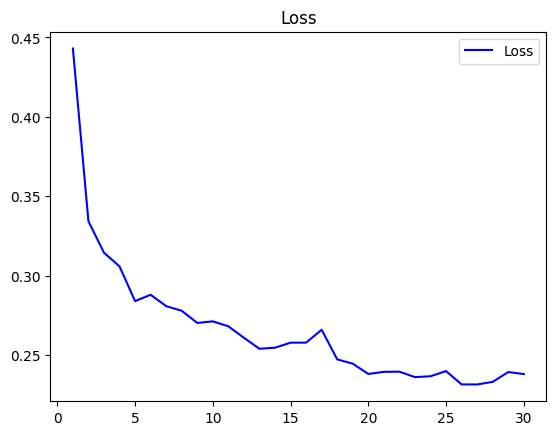

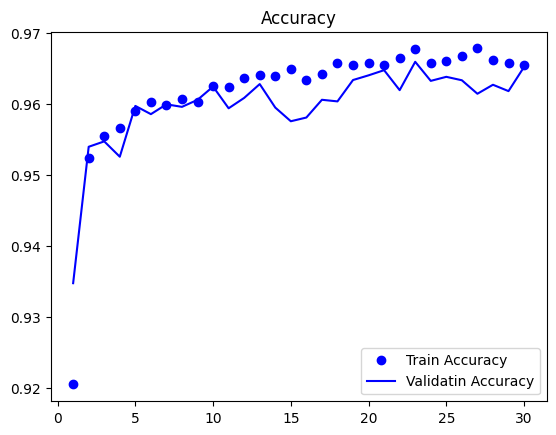

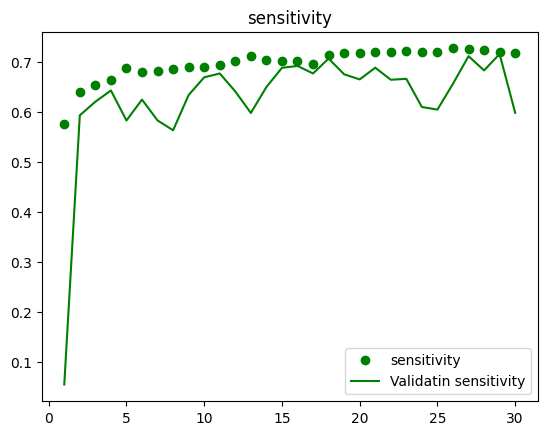

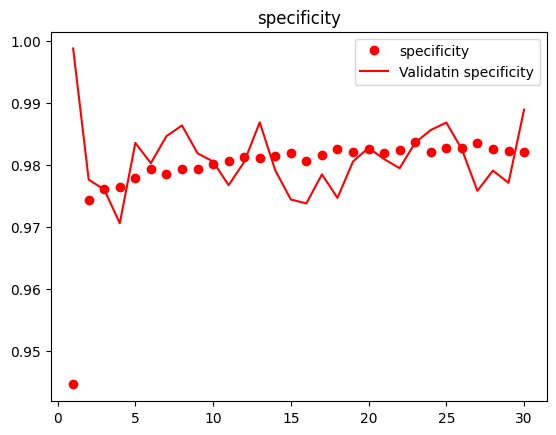

<Figure size 640x480 with 0 Axes>

In [8]:
check_result.plot_history(HISTORY_PATH)

In [9]:
test_preproc = preprocess.build_augmentation_for_general(is_train=False)
test_generator = data_generator.FullSizedDataGenerator(
    TEST_SOURCE, 
    img_size=INPUT_SHAPE,
    output_size=INPUT_SHAPE,
    is_train=False,
    augmentation= test_preproc
)

MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_30ep_512_aG_wo_decay.tf/29--0.2393-0.7206-0.9822-0.7165-0.9771.pb'
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

metrics.print_evaluation(model, test_generator)

77/77 [==============================] - 20s 231ms/step - loss: 0.3830 - sensitivity: 0.6455 - specificity: 0.9592 - accuracy: 0.9387
Loss: 0.38296857476234436
Sensitivity: 0.6455376148223877
Specificity: 0.9592204093933105
Accuracy: 0.9386991262435913


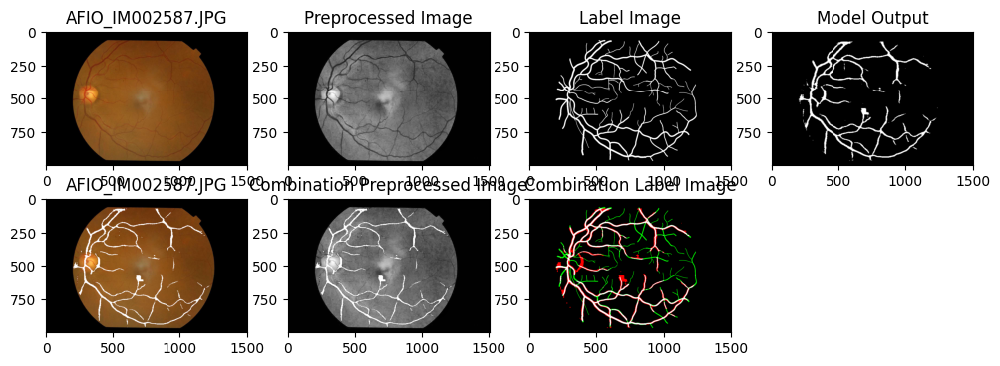

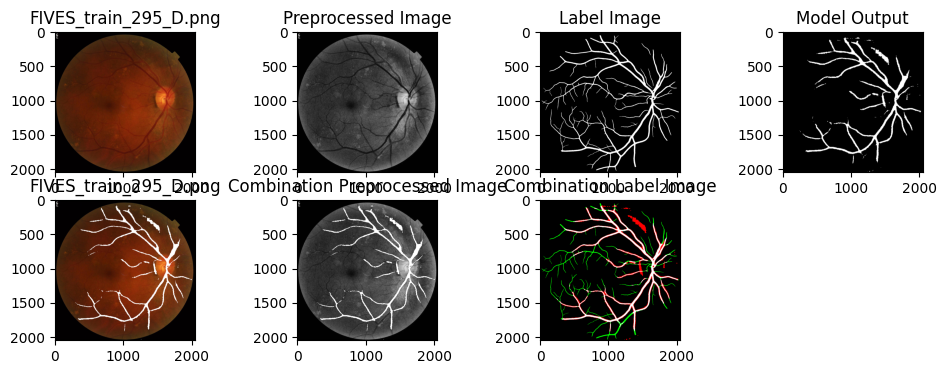

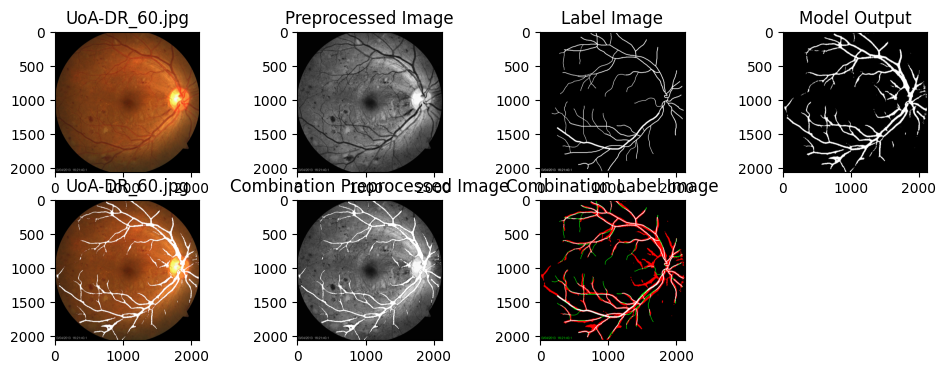

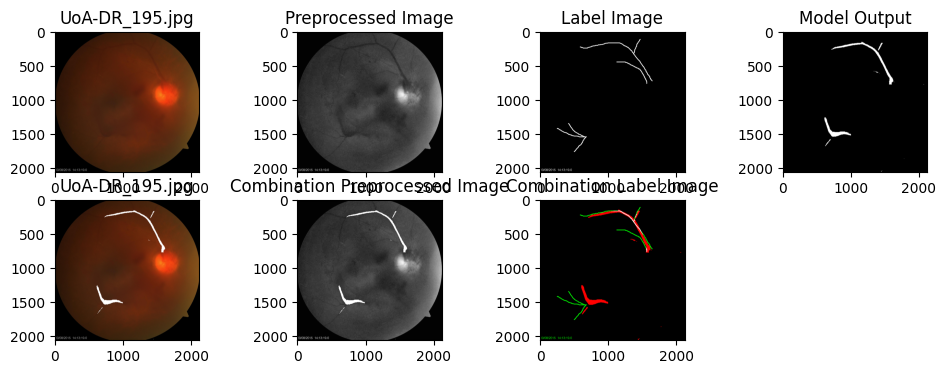

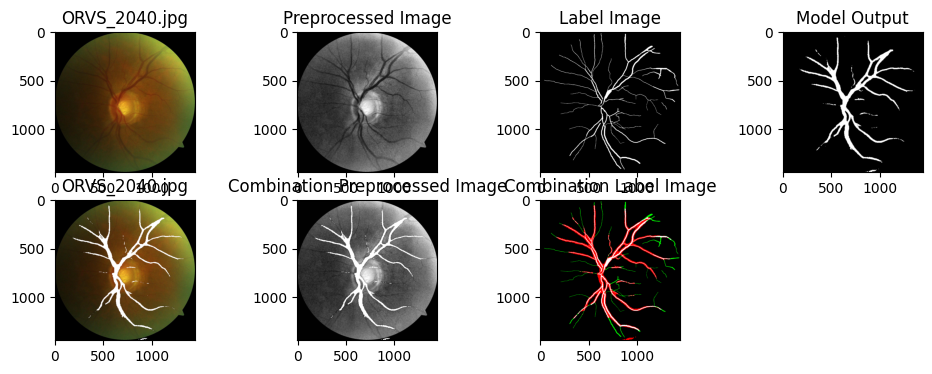

...

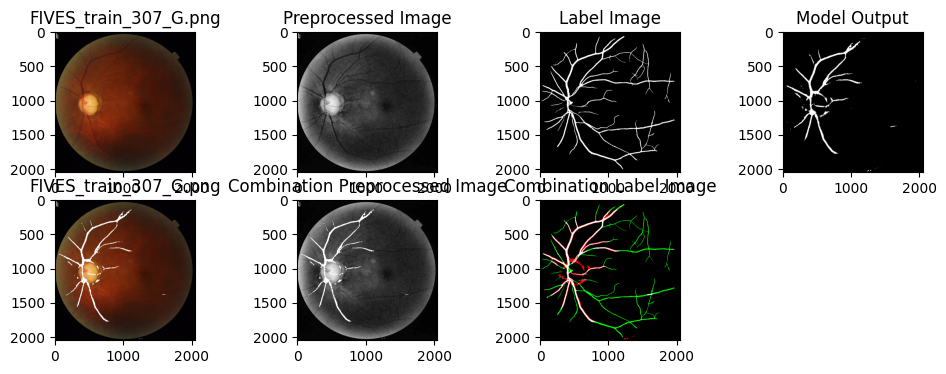

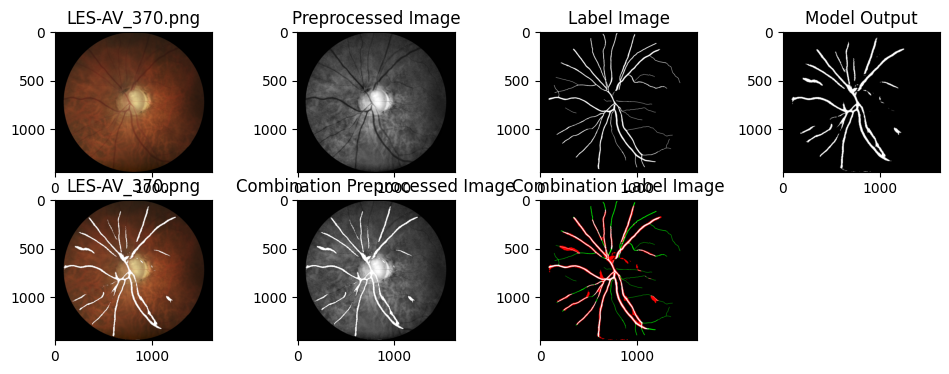

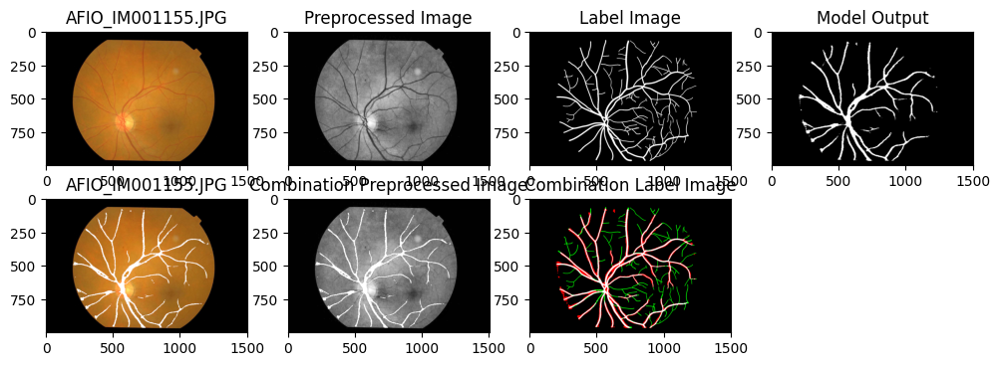

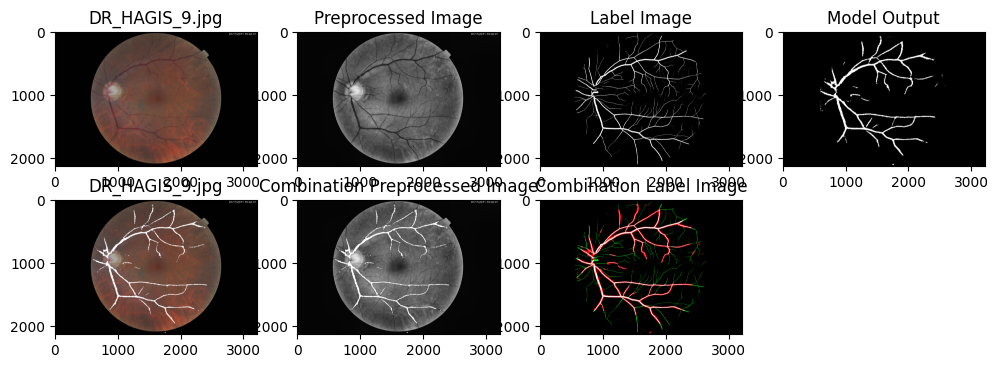

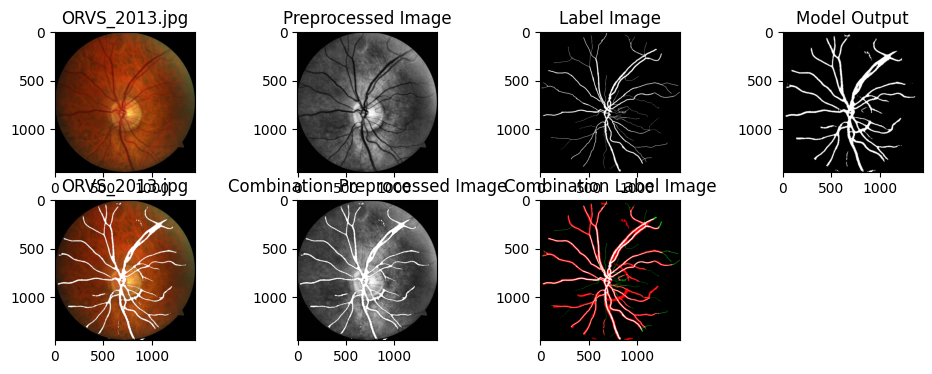

In [10]:
# Plot model result
num_images_to_select = 50
check_result.visualize_FG_result(model, num_images_to_select, TEST_SOURCE, INPUT_SHAPE, test_preproc)